# Belief States in the Residual Stream

*(Setup cell — imports, device, and shared utility functions.)*

In [64]:
from __future__ import annotations

import math
import time
import os
from pathlib import Path
from typing import Final, Literal, Optional, Tuple

import einops
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from IPython.display import HTML, display, clear_output
from ipywidgets import interact, IntSlider, FloatSlider
from jaxtyping import Float, Int
from sklearn.decomposition import PCA
from torch import Tensor
from torch.utils.data import DataLoader, TensorDataset
from tqdm.notebook import tqdm
from transformer_lens import HookedTransformer, HookedTransformerConfig

device = (
    torch.device("mps") if torch.backends.mps.is_available()
    else torch.device("cuda") if torch.cuda.is_available()
    else torch.device("cpu")
)
print(f"Using device: {device}")

if "07-belief-state-transformers" not in os.getcwd():
    os.chdir("07-belief-state-transformers")

CHECKPOINT_DIR = Path("checkpoints")
IMAGE_DIR = Path("images")
plt.rcParams["figure.dpi"] = 120


def project_3d_to_simplex2d(x: Tensor) -> Tensor:
    u = x.new_tensor([-1.0, -1.0, 1.0])
    v = x.new_tensor([-1.0, 1.0, 0.0])
    coords = torch.stack([(x * u).sum(-1), (x * v).sum(-1)], dim=-1)
    return (coords + 1.0) / 2.0


def simplex_triangle_vertices() -> np.ndarray:
    verts_3d = np.array([[1.0, 0.0, 0.0], [0.0, 1.0, 0.0], [0.0, 0.0, 1.0]])
    verts_2d = project_3d_to_simplex2d(torch.from_numpy(verts_3d)).numpy()
    return np.vstack([verts_2d, verts_2d[0:1]])


def draw_simplex(ax: plt.Axes, labels: tuple[str, str, str] = ("A", "B", "C")) -> None:
    tri = simplex_triangle_vertices()
    ax.plot(tri[:, 0], tri[:, 1], "k-", lw=1.0, alpha=0.7)
    offsets = [(-0.06, -0.05), (0.02, -0.05), (-0.03, 0.04)]
    for (x, y), (dx, dy), lbl in zip(tri[:3], offsets, labels):
        ax.text(x + dx, y + dy, lbl, fontsize=10, ha="center")
    ax.set_xlim(-0.15, 1.1)
    ax.set_ylim(-0.1, 1.05)
    ax.set_aspect("equal")
    ax.axis("off")


def kl_divergence(p: Tensor, log_q: Tensor) -> Tensor:
    log_p = torch.log(p.clamp_min(1e-12))
    return (p * (log_p - log_q)).sum(dim=-1)

Using device: mps


## 1. The Setup and the Fractal

### Motivation

Transformer language models are trained on a deceptively simple objective: predict the next token. But does that objective force them to build something deeper — an internal model of the *process* generating the data?

There's a sharp disagreement in the literature. On one side, the "stochastic parrot" view: models are sophisticated pattern matchers that interpolate over surface statistics, but have no genuine understanding of latent structure. On the other side, the "world model" view: optimal next-token prediction on a structured source *requires* tracking that structure. If the data is generated by a hidden process, the only way to predict tokens well is to maintain a belief about what that hidden process is currently doing.

The claim we'll investigate, from [Shai et al. (2024)](https://arxiv.org/abs/2405.15943), is precise: if a transformer achieves near-optimal prediction on sequences generated by a **Hidden Markov Model** (HMM), it must be computing something close to the **Bayesian posterior over hidden states** — the *belief state*. And if that belief state exists in the model, it should be linearly readable from the residual stream.

Can we find it? And if we find it, is it actually *used* for prediction, or just a correlate? This notebook works through both questions.

### The Mess3 HMM

We need a test case where we can compute the ground-truth belief state analytically. The paper uses **Mess3**: a 3-state, 3-token edge-emitting HMM.

Mess3 has a few properties that make it an ideal test bed:

1. **Belief states and next-token probabilities are distinct.** Multiple different belief states can yield the same distribution over the next token. This means recovering the belief geometry from the residual stream is a *strictly stronger* result than just recovering next-token logits — the model would have to do extra work.

2. **The belief geometry has an analytic ground truth.** Belief states live in the 2-simplex Δ² (a triangle in probability space), and Mess3's belief geometry is a self-similar fractal — we can draw the exact shape the model should be tracking.

3. **Infinite Markov order.** No finite $n$-gram model can solve Mess3 — the information in the hidden state doesn't decay with context length. The only way to predict optimally is to track the full posterior.

Each token $x_t \in \{A, B, C\}$ is emitted during a transition between hidden states $s_t \in \{0, 1, 2\}$. The belief state $\eta_t$ is the Bayesian posterior $P(s_t \mid x_0, \ldots, x_t)$, updated via:

$$\eta_t^j \propto \sum_i \eta_{t-1}^i \cdot T^{(x_t)}_{ij}$$

where $T^{(x)}$ is the transition matrix conditioned on emitting token $x$. Let's see this in action.

In [65]:
def _stationary_distribution(transition: Tensor) -> Tensor:
    evals, evecs = torch.linalg.eig(transition.T.to(torch.float32))
    idx = int(torch.argmin(torch.abs(evals - 1.0)).item())
    v = evecs[:, idx].real
    v = torch.clamp(v, min=0.0)
    return v / v.sum()


class Mess3:
    vocab: Final[tuple[str, str, str]] = ("A", "B", "C")

    def __init__(self) -> None:
        t_a = torch.tensor(
            [[0.765, 0.00375, 0.00375],
             [0.0425, 0.0675, 0.00375],
             [0.0425, 0.00375, 0.0675]], dtype=torch.float32,
        )
        t_b = torch.tensor(
            [[0.0675, 0.0425, 0.00375],
             [0.00375, 0.765, 0.00375],
             [0.00375, 0.0425, 0.0675]], dtype=torch.float32,
        )
        t_c = torch.tensor(
            [[0.0675, 0.00375, 0.0425],
             [0.00375, 0.0675, 0.0425],
             [0.00375, 0.00375, 0.765]], dtype=torch.float32,
        )
        self._t_x: Tensor = torch.stack([t_a, t_b, t_c], dim=0)
        self._t: Tensor = t_a + t_b + t_c
        self._pi: Tensor = _stationary_distribution(self._t)
        self._joint: Tensor = einops.rearrange(self._t_x, "x i j -> i (x j)").contiguous()

    @property
    def num_states(self) -> int:
        return 3

    @property
    def vocab_size(self) -> int:
        return 3

    def generate_batch(self, batch_size: int, seq_len: int) -> Tuple[Tensor, Tensor]:
        dev = self._t_x.device
        states = torch.multinomial(self._pi.to(dev), num_samples=batch_size, replacement=True).long()
        seq = torch.empty((batch_size, seq_len), dtype=torch.long, device=dev)
        hidden = torch.empty((batch_size, seq_len + 1), dtype=torch.long, device=dev)
        hidden[:, 0] = states
        for t in range(seq_len):
            probs = self._joint.index_select(0, states).to(dev)
            idx = einops.rearrange(
                torch.multinomial(probs, num_samples=1, replacement=True), "b 1 -> b"
            )
            emission = torch.div(idx, 3, rounding_mode="floor")
            next_state = idx.remainder(3)
            seq[:, t] = emission.long()
            states = next_state.long()
            hidden[:, t + 1] = states
        return seq, hidden

    def belief_states(self, tokens: Tensor) -> Tensor:
        batch_size = int(tokens.shape[0])
        seq_len = int(tokens.shape[1])
        tokens_cpu = tokens.cpu()
        eta = self._pi.to(dtype=torch.float32).expand(batch_size, 3).clone()
        beliefs = torch.empty((batch_size, seq_len, 3), dtype=torch.float32)
        for t in range(seq_len):
            x_t = tokens_cpu[:, t].long()
            t_x = self._t_x.index_select(0, x_t).to(dtype=torch.float32)
            numer = torch.einsum("bi,bij->bj", eta, t_x)
            eta = numer / numer.sum(dim=-1, keepdim=True)
            beliefs[:, t, :] = eta
        return beliefs

    def optimal_next_token_probs_from_beliefs(self, beliefs: Tensor) -> Tensor:
        emit = self._t_x.to(device=beliefs.device, dtype=torch.float32).sum(dim=-1)
        if beliefs.ndim == 2:
            return torch.einsum("bs,xs->bx", beliefs.to(torch.float32), emit)
        return torch.einsum("bts,xs->btx", beliefs.to(torch.float32), emit)

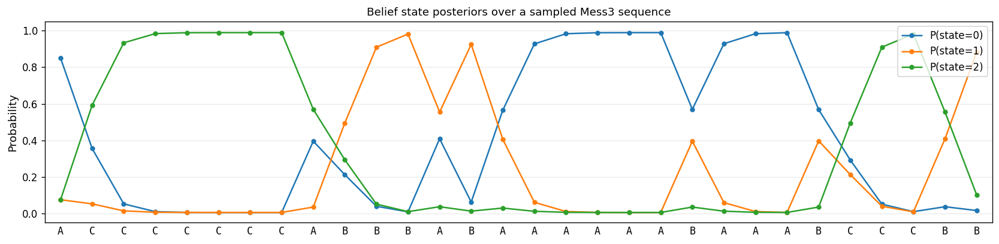

In [66]:
torch.manual_seed(42)
hmm = Mess3()

tokens, _ = hmm.generate_batch(batch_size=1, seq_len=30)
beliefs = hmm.belief_states(tokens)  # (1, 30, 3)

token_seq = tokens[0].tolist()
belief_arr = beliefs[0].numpy()
token_labels = [hmm.vocab[t] for t in token_seq]
xs = np.arange(len(token_seq))

fig, ax = plt.subplots(figsize=(14, 3.5))

colors = ["tab:blue", "tab:orange", "tab:green"]
state_names = ["P(state=0)", "P(state=1)", "P(state=2)"]

for s, (color, name) in enumerate(zip(colors, state_names)):
    ax.plot(xs, belief_arr[:, s], color=color, label=name,
            marker="o", ms=4, lw=1.5, solid_capstyle="round")

ax.set_xticks(xs)
ax.set_xticklabels(token_labels, fontsize=10, fontfamily="monospace")
ax.set_xlim(-0.5, len(xs) - 0.5)
ax.set_ylim(-0.05, 1.05)
ax.set_ylabel("Probability", fontsize=11)
ax.set_title("Belief state posteriors over a sampled Mess3 sequence", fontsize=11)
ax.legend(loc="upper right", fontsize=10)
ax.grid(axis="y", alpha=0.25, lw=0.8)
ax.tick_params(axis="x", length=0)

plt.tight_layout()
plt.show()

Each row shows the Bayesian posterior over the three hidden states after observing that token. You can watch certainty accumulate and then dissolve as the sequence unfolds — some tokens are strongly associated with particular hidden states, while others leave the posterior broad.

The animation below traces a single belief trajectory on the 2-simplex as tokens arrive. Each vertex of the triangle represents certainty about one hidden state.

In [67]:
torch.manual_seed(7)
tokens_anim, _ = hmm.generate_batch(batch_size=1, seq_len=50)
beliefs_anim = hmm.belief_states(tokens_anim)[0]  # (50, 3)
coords_anim = project_3d_to_simplex2d(beliefs_anim).numpy()
token_labels_anim = [hmm.vocab[t] for t in tokens_anim[0].tolist()]

fig, ax = plt.subplots(figsize=(4, 4))
draw_simplex(ax)
trail_line, = ax.plot([], [], "b-", alpha=0.3, lw=1)
dot, = ax.plot([], [], "bo", ms=8)
token_text = ax.text(0.5, -0.08, "", ha="center", fontsize=11, transform=ax.transAxes)
step_text = ax.text(0.98, 0.98, "", ha="right", va="top", fontsize=9, transform=ax.transAxes)
ax.set_title("Belief trajectory on the 2-simplex", fontsize=11)

def init():
    trail_line.set_data([], [])
    dot.set_data([], [])
    return trail_line, dot, token_text, step_text

def update(frame: int):
    xs = coords_anim[:frame+1, 0]
    ys = coords_anim[:frame+1, 1]
    trail_line.set_data(xs, ys)
    dot.set_data([xs[-1]], [ys[-1]])
    token_text.set_text(f"token: {token_labels_anim[frame]}")
    step_text.set_text(f"t = {frame}")
    return trail_line, dot, token_text, step_text

ani = animation.FuncAnimation(
    fig, update, frames=len(coords_anim), init_func=init,
    interval=180, blit=True, repeat=False
)
plt.close(fig)
display(HTML(ani.to_jshtml()))

### The Fractal Geometry

If you run this long enough, something striking happens: the belief states don't fill the simplex uniformly. They cluster into a self-similar fractal.

The reason is the structure of Mess3's update equations. Each token $x$ acts as a contraction map on the simplex — it shrinks and translates the current belief into a specific sub-region. After token $A$, beliefs are pushed toward one corner; after token $B$, toward another; after $C$, toward the third. The full attractor is the set of all belief states reachable in the limit of infinitely long sequences.

This gives us a ground truth to compare against: if the model's residual stream encodes belief states, projecting those activations onto the simplex should reproduce this fractal.

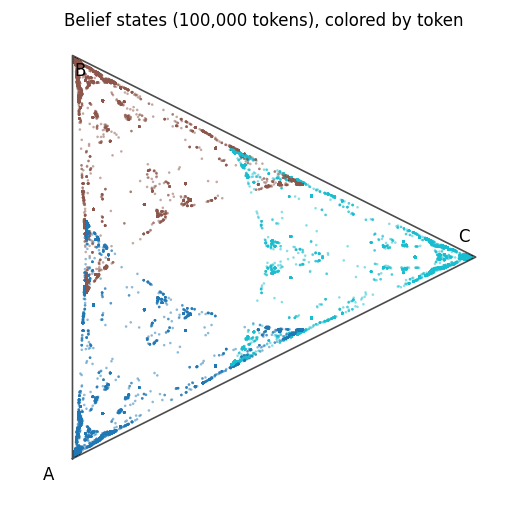

In [68]:
torch.manual_seed(0)
N_FRACTAL = 100_000
SEQ_LEN = 10

toks_fractal, _ = hmm.generate_batch(batch_size=N_FRACTAL // SEQ_LEN, seq_len=SEQ_LEN)
beliefs_fractal = hmm.belief_states(toks_fractal)  # (batch, seq_len, 3)
beliefs_flat = beliefs_fractal.reshape(-1, 3).float()
coords_fractal = project_3d_to_simplex2d(beliefs_flat).numpy()
token_colors = toks_fractal.reshape(-1).numpy()

fig, ax = plt.subplots(figsize=(4.5, 4.5))
draw_simplex(ax)
sc = ax.scatter(
    coords_fractal[:, 0], coords_fractal[:, 1],
    c=token_colors, cmap="tab10", s=0.3, alpha=0.5, vmin=0, vmax=2
)
ax.set_title(f"Belief states ({N_FRACTAL:,} tokens), colored by token", fontsize=10)
plt.tight_layout()
plt.show()

For reference, here's what the asymptotic attractor looks like after 1M tokens, broken down by sequence position within a context window of length 10:

![Belief states by position, 1M tokens](images/beliefs_by_position_dataset_1000000.png)

Early positions (small $t$) are broad and uncertain; later positions concentrate into sharper sub-fractals as the model accumulates more evidence about the hidden state.

---

## 2. The Transformer

We train a small transformer on next-token prediction over Mess3 sequences. The architecture, taken directly from the paper:

| Hyperparameter | Value |
|---|---|
| Layers | 4 |
| d_model | 64 |
| Heads | 1 |
| d_head | 8 |
| d_mlp | 256 |
| Activation | ReLU |
| Context length | 10 |

One thing worth noting: with d_model=64 and only 10 tokens of context, this model has about 200K parameters and can't meaningfully memorize sequences. Any good performance it achieves has to come from learning a *general* rule — and for Mess3, the only general rule is tracking the Bayesian posterior. That's what makes it a meaningful test case.

Training runs next-token cross-entropy loss on batches of sequences sampled fresh from the HMM each step — so the model never sees the same sequence twice. After 1M gradient steps with AdamW, the model's per-token KL divergence from the optimal Bayesian predictor approaches zero.

The training command (takes ~24 hours to full convergence; we'll use the saved checkpoint):

In [69]:
# python scripts/train_transformer.py \
#     --optimizer adamw \
#     --epochs 1000000 \
#     --save-path final_checkpoints/transformer/adamw/step_1000000.pt

We instantiate the model with the exact architecture from the paper (via `BeliefStateTransformer.from_paper_config`) and load the saved state dict. The model runs on CPU just fine for inference — it's only 200K parameters.

In [70]:
class BeliefStateTransformer(HookedTransformer):
    @classmethod
    def from_paper_config(
        cls, vocab_size: int, device: str | torch.device | None = None
    ) -> "BeliefStateTransformer":
        cfg = HookedTransformerConfig(
            n_layers=4, d_model=64, n_ctx=10, d_head=8, n_heads=1, d_mlp=256,
            act_fn="relu", d_vocab=vocab_size, d_vocab_out=vocab_size,
            normalization_type="LN", attention_dir="causal",
            device=str(device) if device is not None else None,
        )
        return cls(cfg)

    def forward_tokens(
        self, tokens: Int[Tensor, "batch pos"]
    ) -> Float[Tensor, "batch pos d_vocab"]:
        return self.forward(tokens, return_type="logits")

    def forward_with_residuals(
        self,
        tokens: Int[Tensor, "batch pos"],
        resid_stage: Literal["pre", "mid", "post"] = "post",
        layers: list[int] | None = None,
    ) -> Tuple[Float[Tensor, "batch pos d_vocab"], Float[Tensor, "layer batch pos d_model"]]:
        logits, cache = self.run_with_cache(tokens, return_type="logits")
        suffix = {"pre": "hook_resid_pre", "mid": "hook_resid_mid", "post": "hook_resid_post"}[resid_stage]
        if layers is None:
            layers = [self.cfg.n_layers - 1]
        activations = torch.stack([cache[f"blocks.{l}.{suffix}"] for l in layers], dim=0)
        return logits, activations


def load_transformer(checkpoint_path: Path) -> BeliefStateTransformer:
    hmm = Mess3()
    model = BeliefStateTransformer.from_paper_config(vocab_size=hmm.vocab_size, device=device)
    state_dict = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(state_dict)
    model.eval()
    return model

In [71]:
model = load_transformer(CHECKPOINT_DIR / "step_1000000.pt")
print(f"Loaded transformer: {sum(p.numel() for p in model.parameters()):,} parameters")
print(f"Architecture: {model.cfg.n_layers} layers, d_model={model.cfg.d_model}, "
      f"{model.cfg.n_heads} head(s), context={model.cfg.n_ctx}")

Loaded transformer: 143,075 parameters
Architecture: 4 layers, d_model=64, 1 head(s), context=10


### Training Dynamics

The image below shows PCA of the residual stream activations at several training checkpoints (1K, 100K, 300K, 500K, 700K, 1M steps), computed on a fixed set of HMM sequences and coloured by the ground-truth belief state.

![Residual stream PCA across AdamW training steps](images/adamw_pca_multi.png)

Early in training, the activations are unstructured — the first two principal components don't correspond to anything interpretable. Over time, the fractal geometry of the belief simplex *emerges* in the residual stream. By the final checkpoint, the PCA projection closely resembles the ground-truth fractal.

This doesn't prove the model is using beliefs — it might just be that the belief geometry is a convenient intermediate representation for next-token prediction. But it's a compelling starting point. The slider below lets you replay this evolution interactively.

---

## 3. Linear Probing

PCA hints at structure but doesn't quantify it. For that we use a **linear probe**: a simple linear map from the 64-dimensional residual stream to the 3-dimensional belief state vector, trained with MSE loss.

If a linear probe can recover the belief state with high accuracy, it means the belief information is *linearly* encoded in the residual stream — not buried in some complex nonlinear subspace, but sitting there as a straightforward linear feature.

**A note on temporal alignment.** Mess3 is edge-emitting: token $x_t$ is emitted *during* the transition from $s_{t-1}$ to $s_t$. The belief state at position $t$ is therefore the posterior after observing $x_t$: $P(s_t \mid x_0, \ldots, x_t)$. We pair the residual stream activation at position $t$ with this post-observation belief — both refer to the same moment after the token has been processed.

### Sampling Activations

First we generate a dataset of (activation, belief) pairs by running the trained transformer on HMM sequences. We sample from the final layer's residual stream (`hook_resid_post` after layer 3), at every position.

In [72]:
# Equivalent CLI:
# python scripts/sample_acts.py \
#     --checkpoint-path checkpoints/step_1000000.pt \
#     --num-sequences 100000 --resid-stage post --layers 3

N_SEQUENCES = 50_000
BATCH_SIZE = 256
SEQ_LEN = model.cfg.n_ctx  # 10

acts_list: list[Tensor] = []
beliefs_list: list[Tensor] = []
tokens_list: list[Tensor] = []

torch.manual_seed(0)
remaining = N_SEQUENCES
with torch.no_grad():
    pbar = tqdm(total=N_SEQUENCES, desc="Sampling activations")
    while remaining > 0:
        bs = min(BATCH_SIZE, remaining)
        toks, _ = hmm.generate_batch(batch_size=bs, seq_len=SEQ_LEN)
        toks = toks.to(device)
        beliefs_b = hmm.belief_states(toks)  # (bs, seq_len, 3)
        _, acts_b = model.forward_with_residuals(toks, resid_stage="post", layers=[3])
        # acts_b: (1, bs, seq_len, 64)
        acts_flat = acts_b[0].reshape(-1, 64).cpu().float()  # (bs*seq_len, 64)
        beliefs_flat_b = beliefs_b.reshape(-1, 3).cpu().float()
        acts_list.append(acts_flat)
        beliefs_list.append(beliefs_flat_b)
        tokens_list.append(toks.cpu())
        remaining -= bs
        pbar.update(bs)
    pbar.close()

acts_all = torch.cat(acts_list, dim=0)        # (N_SEQUENCES*SEQ_LEN, 64)
beliefs_all = torch.cat(beliefs_list, dim=0)  # (N_SEQUENCES*SEQ_LEN, 3)
tokens_all = torch.cat(tokens_list, dim=0)    # (N_SEQUENCES, SEQ_LEN)

print(f"Activation dataset: {acts_all.shape[0]:,} samples")
print(f"acts shape: {tuple(acts_all.shape)}, beliefs shape: {tuple(beliefs_all.shape)}")

Sampling activations:   0%|          | 0/50000 [00:00<?, ?it/s]

Activation dataset: 500,000 samples
acts shape: (500000, 64), beliefs shape: (500000, 3)


### Training the Probe

The probe is a single linear layer: residual stream (64-dim) → belief state (3-dim), trained with MSE loss. We use an 80/20 train/eval split and run for 500 epochs. To visualise progress, we save snapshots of the probe's 2D simplex projection every 50 epochs.

In [73]:
class LinearProbe(nn.Module):
    def __init__(self, d_in: int, d_out: int = 3) -> None:
        super().__init__()
        self.linear = nn.Linear(d_in, d_out)

    def forward(self, x: Tensor) -> Tensor:
        return self.linear(x)

In [74]:
torch.manual_seed(0)

PROBE_EPOCHS = 500
PROBE_LR = 1e-3
PROBE_BATCH = 4096
TRAIN_FRAC = 0.8

def _want_snapshot(epoch: int) -> bool:
    return epoch <= 10 or (epoch <= 50 and epoch % 10 == 0) or epoch % 100 == 0

n_total = acts_all.shape[0]
n_train = int(n_total * TRAIN_FRAC)
perm = torch.randperm(n_total)
train_idx, eval_idx = perm[:n_train], perm[n_train:]

# Keep data and probe on CPU. The probe is a 64→3 linear layer — the compute is
# trivial and MPS/CUDA kernel-launch overhead dominates for models this small.
# On CPU with BLAS, 500 K samples × 500 epochs runs in well under a minute.
probe_device = torch.device("cpu")

acts_train    = acts_all[train_idx]    # already float32 on CPU
beliefs_train = beliefs_all[train_idx]
acts_eval     = acts_all[eval_idx]
beliefs_eval  = beliefs_all[eval_idx]

train_loader = DataLoader(
    TensorDataset(acts_train, beliefs_train),
    batch_size=PROBE_BATCH, shuffle=True
)
eval_loader = DataLoader(
    TensorDataset(acts_eval, beliefs_eval),
    batch_size=PROBE_BATCH, shuffle=False
)

probe = LinearProbe(d_in=64, d_out=3).to(probe_device)
optimizer = torch.optim.AdamW(probe.parameters(), lr=PROBE_LR)
loss_fn = nn.MSELoss()

train_losses: list[float] = []
eval_losses: list[float] = []
probe_snapshots: list[np.ndarray] = []  # 2D simplex projections at eval time
snapshot_epochs: list[int] = []

for epoch in tqdm(range(1, PROBE_EPOCHS + 1), desc="Training probe"):
    probe.train()
    total_train, count_train = 0.0, 0
    for batch_acts, batch_beliefs in train_loader:
        optimizer.zero_grad(set_to_none=True)
        loss = loss_fn(probe(batch_acts), batch_beliefs)
        loss.backward()
        optimizer.step()
        total_train += loss.item() * batch_acts.shape[0]
        count_train += batch_acts.shape[0]
    train_losses.append(total_train / count_train)

    probe.eval()
    total_eval, count_eval = 0.0, 0
    snapshot_preds: list[Tensor] = []
    with torch.no_grad():
        for batch_acts, batch_beliefs in eval_loader:
            preds = probe(batch_acts)
            total_eval += loss_fn(preds, batch_beliefs).item() * batch_acts.shape[0]
            count_eval += batch_acts.shape[0]
            if _want_snapshot(epoch):
                snapshot_preds.append(preds)
    eval_losses.append(total_eval / count_eval)

    if _want_snapshot(epoch) and snapshot_preds:
        all_preds = torch.cat(snapshot_preds, dim=0)
        probe_snapshots.append(project_3d_to_simplex2d(all_preds).numpy())
        snapshot_epochs.append(epoch)

print(f"Final eval MSE: {eval_losses[-1]:.6f}")

Training probe:   0%|          | 0/500 [00:00<?, ?it/s]

Final eval MSE: 0.002096


The probe trains via standard SGD through a `DataLoader`. At each epoch we evaluate on the held-out split and, every 50 epochs, save a snapshot of the probe's projected outputs on the simplex — this gives us the animation below. The loss curve shows convergence:

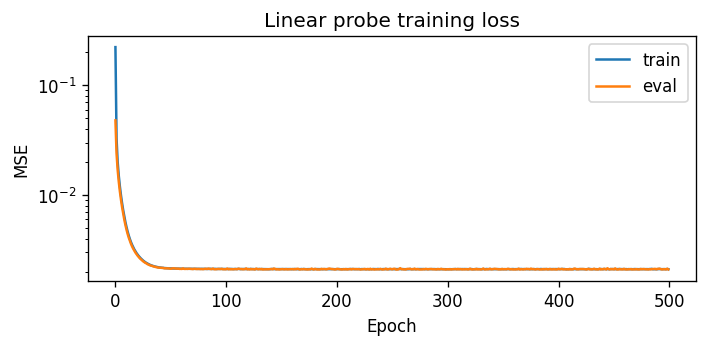

In [75]:
fig, ax = plt.subplots(figsize=(6, 3))
ax.plot(train_losses, label="train", lw=1.5)
ax.plot(eval_losses, label="eval", lw=1.5)
ax.set_xlabel("Epoch")
ax.set_ylabel("MSE")
ax.set_title("Linear probe training loss")
ax.legend()
ax.set_yscale("log")
plt.tight_layout()
plt.show()

The probe converges quickly. As it trains, its output geometry morphs from a cloud into the fractal simplex. The animation below replays that convergence — frames are sampled densely at the start (epochs 1–10) to capture the rapid early shift, then more sparsely through to epoch 500.

In [76]:
eval_beliefs_np = beliefs_all[eval_idx].numpy()
max_pts = min(len(eval_beliefs_np), probe_snapshots[0].shape[0]) if probe_snapshots else 0
colors_pa = np.clip(eval_beliefs_np[:max_pts], 0, 1)

fig_pa, ax_pa = plt.subplots(figsize=(4.5, 4.5))
draw_simplex(ax_pa)
scat_pa = ax_pa.scatter([], [], s=0.5, alpha=0.6)
title_pa = ax_pa.set_title("")
plt.tight_layout()

def _init_probe_anim():
    scat_pa.set_offsets(np.empty((0, 2)))
    return (scat_pa,)

def _update_probe_anim(frame: int):
    coords = probe_snapshots[frame][:max_pts]
    scat_pa.set_offsets(coords)
    scat_pa.set_color(colors_pa)
    ax_pa.set_title(f"Probe outputs on simplex — epoch {snapshot_epochs[frame]}")
    return (scat_pa,)

probe_ani = animation.FuncAnimation(
    fig_pa, _update_probe_anim, frames=len(probe_snapshots),
    init_func=_init_probe_anim, interval=200, blit=False, repeat=False
)
plt.close(fig_pa)
display(HTML(probe_ani.to_jshtml()))

### Visualisation

The side-by-side comparison below shows the ground-truth optimal belief states (left) versus the probe-predicted beliefs (right), both projected onto the 2D simplex. Points are coloured by their belief coordinates (RGB = state probabilities).

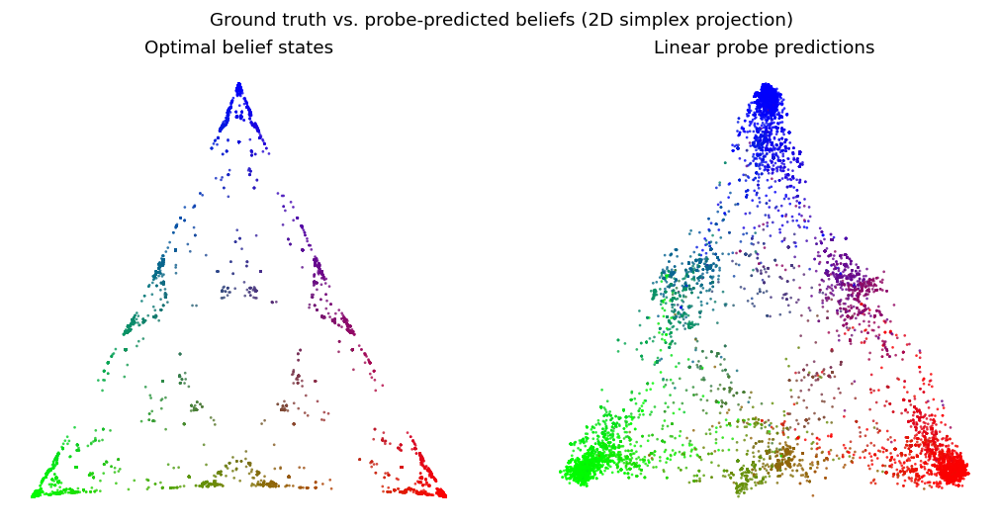

In [77]:
N_PLOT = 20_000
torch.manual_seed(0)
plot_idx = torch.randperm(acts_all[eval_idx].shape[0])[:N_PLOT]

probe.eval()
with torch.no_grad():
    probe_preds = probe(acts_all[eval_idx][plot_idx].to(probe_device)).cpu()  # (N_PLOT, 3)

optimal_beliefs_plot = beliefs_all[eval_idx][plot_idx]  # (N_PLOT, 3)

opt_2d = project_3d_to_simplex2d(optimal_beliefs_plot)
pred_2d = project_3d_to_simplex2d(probe_preds)
rgb = np.clip(optimal_beliefs_plot.numpy(), 0, 1)

# Match the plotting convention from the research repo: rotate 90° CCW
def rot90(coords: np.ndarray) -> tuple[np.ndarray, np.ndarray]:
    return -coords[:, 1], coords[:, 0]

opt_x, opt_y = rot90(opt_2d.numpy())
pred_x, pred_y = rot90(pred_2d.numpy())

fig, axes = plt.subplots(1, 2, figsize=(9, 4.5))
axes[0].scatter(opt_x, opt_y, c=rgb, s=0.4, alpha=0.8)
axes[0].set_title("Optimal belief states", fontsize=11)
axes[0].set_aspect("equal")
axes[0].axis("off")
axes[1].scatter(pred_x, pred_y, c=rgb, s=0.4, alpha=0.8)
axes[1].set_title("Linear probe predictions", fontsize=11)
axes[1].set_aspect("equal")
axes[1].axis("off")
fig.suptitle("Ground truth vs. probe-predicted beliefs (2D simplex projection)", fontsize=11)
plt.tight_layout()
plt.show()

The match is striking — the fractal geometry is essentially preserved under the linear map. Below are four views of the probe’s 3D output space rendered directly from the trained probe:

In [78]:
import plotly.graph_objects as go

probe.eval()
with torch.no_grad():
    preds_3d = probe(acts_all[eval_idx][plot_idx].to(probe_device)).cpu().numpy()

rgb_3d = np.clip(preds_3d, 0, 1)
colors = [f"rgb({r:.3f},{g:.3f},{b:.3f})" for r, g, b in rgb_3d]

fig = go.Figure(go.Scatter3d(
    x=preds_3d[:, 0],
    y=preds_3d[:, 1],
    z=preds_3d[:, 2],
    mode="markers",
    marker=dict(size=2, color=colors, opacity=0.8),
))
fig.update_layout(
    title="Linear probe outputs in 3D",
    scene=dict(
        xaxis_title="probe 1",
        yaxis_title="probe 2",
        zaxis_title="probe 3",
    ),
    width=700,
    height=700,
)
fig.show()

---

## 4. Causal Intervention

### The Correlation vs. Causation Problem

The linear probe shows that the belief geometry is *present* in the residual stream. But presence doesn't imply use. It's possible that the model computes next-token predictions through some entirely different internal pathway, and the belief states we're reading out are just a correlate — a convenient byproduct of learning, not an active part of the computation.

To test causality, we need to *intervene*: reach into the residual stream, modify the encoded belief, and check whether predictions shift accordingly.

The prediction is clear. Take a sequence and a position $t$. The model's current belief is $\eta_t$ (the posterior given the actual tokens seen so far). Suppose instead the token at position $t$ had been different — this would have produced a *counterfactual* belief $\tilde{\eta}_t$. If we steer the residual stream toward $\tilde{\eta}_t$, we'd expect:

- **KL(optimal-actual ‖ steered prediction) to *increase*** — the model now predicts less like what's optimal for the real sequence
- **KL(optimal-counterfactual ‖ steered prediction) to *decrease*** — the model now predicts more like what's optimal for the counterfactual

If both move in the predicted direction, the belief geometry is causally upstream of prediction.

### The Autoencoder

Why not just use the linear probe to steer? Because the probe is not invertible. It maps 64 dimensions to 3, discarding 61 dimensions of information. We can't use it to *construct* an activation that encodes a target belief.

The solution is an **autoencoder** with a dual objective:

1. **Reconstruction loss** `λ_recon · MSE(decoded, original_activation)` — ensures the decoder is actually invertible, i.e. decoding brings us back to a plausible residual stream vector
2. **Geometry loss** `λ_geom · MSE(encoded, projected_belief)` — aligns the 2D latent space with the 2D simplex projection of the optimal belief

The encoder maps: residual stream (64-dim) → 2D latent. The decoder maps: 2D latent → residual stream. To steer to a belief $\tilde{\eta}$, we project it to the 2D simplex, then decode — giving us a 64-dim activation that corresponds to that belief. We then swap this into the residual stream at the target position.

The $\lambda$ tradeoff between the two losses required iteration: too much geometry loss and the decoder loses fidelity; too much reconstruction loss and the latent space doesn't align with the simplex. The runs used $\lambda_{\text{recon}} = \lambda_{\text{geom}} = 1.0$.

### Training the Autoencoder

The training loop runs both losses simultaneously. At each step: encode the activation to get a 2D latent, decode it back, compute `recon_loss = MSE(decoded, original)`. Then compare the 2D latent against the simplex projection of the ground-truth belief: `geom_loss = MSE(encoded, project_3d_to_simplex2d(belief))`. The total loss is their weighted sum. We also collect snapshots of the latent space every 80 epochs to animate alignment progress.

In [79]:
class Autoencoder(nn.Module):
    def __init__(self, d_in: int, hidden_dim: int = 2, use_activation: bool = True) -> None:
        super().__init__()
        self.d_in = d_in
        self.hidden_dim = hidden_dim
        if use_activation:
            self.encoder = nn.Sequential(nn.Linear(d_in, hidden_dim), nn.ReLU())
        else:
            self.encoder = nn.Linear(d_in, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, d_in)

    def encode(self, x: Tensor) -> Tensor:
        return self.encoder(x)

    def decode(self, z: Tensor) -> Tensor:
        return self.decoder(z)

    def decode_from_belief(self, beliefs: Tensor) -> Tensor:
        latents = project_3d_to_simplex2d(beliefs.float())
        return self.decode(latents)

    def forward(self, x: Tensor) -> Tensor:
        return self.decode(self.encode(x))

In [80]:
torch.manual_seed(0)

AE_EPOCHS = 800
AE_LR = 1e-3
AE_BATCH = 4096
LAMBDA_RECON = 1.0
LAMBDA_GEOM = 1.0

n_total_ae = acts_all.shape[0]
n_train_ae = int(n_total_ae * 0.8)
perm_ae = torch.randperm(n_total_ae)
train_idx_ae = perm_ae[:n_train_ae]
eval_idx_ae = perm_ae[n_train_ae:]

train_loader_ae = DataLoader(
    TensorDataset(acts_all[train_idx_ae], beliefs_all[train_idx_ae]),
    batch_size=AE_BATCH, shuffle=True
)
eval_loader_ae = DataLoader(
    TensorDataset(acts_all[eval_idx_ae], beliefs_all[eval_idx_ae]),
    batch_size=AE_BATCH, shuffle=False
)

autoencoder = Autoencoder(d_in=64, hidden_dim=2, use_activation=True).to(device)
ae_optimizer = torch.optim.AdamW(autoencoder.parameters(), lr=AE_LR)
ae_loss_fn = nn.MSELoss()

ae_train_recon: list[float] = []
ae_train_geom: list[float] = []
ae_eval_recon: list[float] = []
ae_eval_geom: list[float] = []
ae_snapshots: list[np.ndarray] = []
ae_snapshot_epochs: list[int] = []

def _ae_want_snapshot(epoch: int) -> bool:
    return epoch <= 10 or (epoch <= 50 and epoch % 10 == 0) or epoch % 100 == 0

for epoch in tqdm(range(1, AE_EPOCHS + 1), desc="Training autoencoder"):
    autoencoder.train()
    r_sum, g_sum, n_tr = 0.0, 0.0, 0
    for batch_acts, batch_beliefs in train_loader_ae:
        batch_acts = batch_acts.to(device)
        batch_beliefs = batch_beliefs.to(device)
        ae_optimizer.zero_grad(set_to_none=True)
        encoded = autoencoder.encode(batch_acts)
        decoded = autoencoder.decode(encoded)
        recon_loss = ae_loss_fn(decoded, batch_acts)
        target_simplex = project_3d_to_simplex2d(batch_beliefs)
        geom_loss = ae_loss_fn(encoded, target_simplex)
        total_loss = LAMBDA_RECON * recon_loss + LAMBDA_GEOM * geom_loss
        total_loss.backward()
        ae_optimizer.step()
        bs = batch_acts.shape[0]
        r_sum += recon_loss.item() * bs; g_sum += geom_loss.item() * bs; n_tr += bs
    ae_train_recon.append(r_sum / n_tr)
    ae_train_geom.append(g_sum / n_tr)

    autoencoder.eval()
    r_sum_e, g_sum_e, n_ev = 0.0, 0.0, 0
    snap_latents: list[Tensor] = []
    snap_beliefs: list[Tensor] = []
    with torch.no_grad():
        for batch_acts, batch_beliefs in eval_loader_ae:
            batch_acts = batch_acts.to(device)
            batch_beliefs = batch_beliefs.to(device)
            encoded = autoencoder.encode(batch_acts)
            decoded = autoencoder.decode(encoded)
            recon_loss = ae_loss_fn(decoded, batch_acts)
            target_simplex = project_3d_to_simplex2d(batch_beliefs)
            geom_loss = ae_loss_fn(encoded, target_simplex)
            bs = batch_acts.shape[0]
            r_sum_e += recon_loss.item() * bs; g_sum_e += geom_loss.item() * bs; n_ev += bs
            if _ae_want_snapshot(epoch):
                snap_latents.append(encoded.cpu())
                snap_beliefs.append(batch_beliefs.cpu())
    ae_eval_recon.append(r_sum_e / n_ev)
    ae_eval_geom.append(g_sum_e / n_ev)

    if _ae_want_snapshot(epoch) and snap_latents:
        ae_snapshots.append(torch.cat(snap_latents, dim=0).numpy())
        ae_snapshot_epochs.append(epoch)

print(f"Final eval — recon: {ae_eval_recon[-1]:.6f}, geometry: {ae_eval_geom[-1]:.6f}")

Training autoencoder:   0%|          | 0/800 [00:00<?, ?it/s]

Final eval — recon: 0.618080, geometry: 0.008335


The two losses pull in complementary directions — reconstruction wants the decoder to be a faithful inverse, geometry wants the latent to mirror the simplex. Both should decrease, though reconstruction typically converges faster because the linear decoder has an easy solution as long as the encoder doesn't collapse the space:

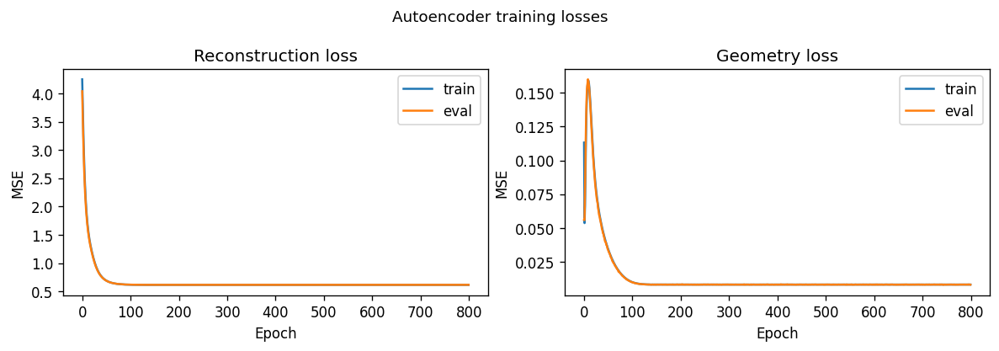

In [81]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))
axes[0].plot(ae_train_recon, label="train", lw=1.5)
axes[0].plot(ae_eval_recon, label="eval", lw=1.5)
axes[0].set_title("Reconstruction loss")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("MSE")
axes[0].legend()
axes[1].plot(ae_train_geom, label="train", lw=1.5)
axes[1].plot(ae_eval_geom, label="eval", lw=1.5)
axes[1].set_title("Geometry loss")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("MSE")
axes[1].legend()
plt.suptitle("Autoencoder training losses", fontsize=11)
plt.tight_layout()
plt.show()

As training progresses, the autoencoder's 2D latent space aligns with the simplex projection of the belief states. The animation below replays that convergence — frames are sampled densely at the start (epochs 1–10) to capture the rapid early shift, then every 10 epochs through 50, then every 100 epochs onwards.

In [82]:
ae_eval_beliefs_np = beliefs_all[eval_idx_ae].numpy()
ae_max_pts = min(ae_eval_beliefs_np.shape[0], ae_snapshots[0].shape[0]) if ae_snapshots else 0
colors_ae = np.clip(ae_eval_beliefs_np[:ae_max_pts], 0, 1)

all_latents = np.concatenate(ae_snapshots, axis=0)
x_min, x_max = all_latents[:, 0].min() - 0.05, all_latents[:, 0].max() + 0.05
y_min, y_max = all_latents[:, 1].min() - 0.05, all_latents[:, 1].max() + 0.05

fig_ae, ax_ae = plt.subplots(figsize=(4.5, 4.5))
ax_ae.set_xlim(x_min, x_max)
ax_ae.set_ylim(y_min, y_max)
ax_ae.set_xlabel("latent dim 1")
ax_ae.set_ylabel("latent dim 2")
scat_ae = ax_ae.scatter([], [], s=0.5, alpha=0.7)
plt.tight_layout()

def _init_ae_anim():
    scat_ae.set_offsets(np.empty((0, 2)))
    return (scat_ae,)

def _update_ae_anim(frame: int):
    latents = ae_snapshots[frame][:ae_max_pts]
    scat_ae.set_offsets(latents)
    scat_ae.set_color(colors_ae)
    ax_ae.set_title(f"Autoencoder latent space — epoch {ae_snapshot_epochs[frame]}")
    return (scat_ae,)

ae_ani = animation.FuncAnimation(
    fig_ae, _update_ae_anim, frames=len(ae_snapshots),
    init_func=_init_ae_anim, interval=200, blit=False, repeat=False
)
plt.close(fig_ae)
display(HTML(ae_ani.to_jshtml()))

### Counterfactual Steering

Now for the causal test. We pick a sequence and a position $t$. The actual token at position $t$ produced belief $\eta_t$. We ask: what would the belief have been if a *different* token had appeared at position $t$? Call that counterfactual belief $\tilde{\eta}_t$.

We compute $\tilde{\eta}_t$ exactly using the HMM update equations: take the belief at position $t-1$, then apply the counterfactual token's transition matrix instead of the actual one.

Then we:
1. Run the model on the original sequence to get the original residual stream activation at position $t$
2. Use the autoencoder to decode $\tilde{\eta}_t$ into a replacement activation
3. Replace the residual stream at position $t$ with this decoded activation
4. Measure how next-token predictions shift

Let's first look at a concrete single example.

In [83]:
torch.manual_seed(99)
autoencoder.eval()
model.eval()

ex_tokens, _ = hmm.generate_batch(batch_size=1, seq_len=model.cfg.n_ctx)
ex_tokens = ex_tokens.to(device)
ex_beliefs = hmm.belief_states(ex_tokens)  # (1, 10, 3)

STEER_POS = model.cfg.n_ctx - 1  # steer at the last position

# Compute counterfactual belief for each alternative token
eta_prev = ex_beliefs[0, STEER_POS - 1, :].to(torch.float32)  # belief before position t
eta_actual = ex_beliefs[0, STEER_POS, :].to(torch.float32)    # actual belief at position t
actual_token = int(ex_tokens[0, STEER_POS].item())

emit = hmm._t_x.to(dtype=torch.float32)
counterfactual_beliefs: dict[int, Tensor] = {}
for tok in range(3):
    if tok == actual_token:
        continue
    numer = torch.matmul(eta_prev, emit[tok])
    counterfactual_beliefs[tok] = numer / numer.sum()

# Get base predictions (no steering)
with torch.no_grad():
    logits_base = model.forward_tokens(ex_tokens)
    probs_base = torch.softmax(logits_base[0, STEER_POS, :], dim=-1).cpu()

print(f"Sequence: {' '.join(hmm.vocab[t] for t in ex_tokens[0].tolist())}")
print(f"Actual token at position {STEER_POS}: {hmm.vocab[actual_token]}")
print(f"\nActual belief:         {[f'{v:.4f}' for v in eta_actual.tolist()]}")
print(f"Base next-tok probs:   {[f'{v:.4f}' for v in probs_base.tolist()]}")
print()

for cf_tok, eta_tilde in counterfactual_beliefs.items():
    optimal_cf = hmm.optimal_next_token_probs_from_beliefs(eta_tilde.unsqueeze(0)).squeeze(0)
    optimal_actual = hmm.optimal_next_token_probs_from_beliefs(eta_actual.unsqueeze(0)).squeeze(0)

    # Steer the residual stream
    target_act = autoencoder.decode_from_belief(eta_tilde.float().unsqueeze(0).to(device))  # (1, 64)

    def hook_replace(acts: Tensor, hook=None) -> Tensor:
        updated = acts.clone()
        updated[:, STEER_POS, :] = target_act
        return updated

    with torch.no_grad():
        logits_steer = model.run_with_hooks(
            ex_tokens, return_type="logits",
            fwd_hooks=[(f"blocks.3.hook_resid_post", hook_replace)]
        )
    probs_steer = torch.softmax(logits_steer[0, STEER_POS, :], dim=-1).cpu()

    kl_actual_base = kl_divergence(optimal_actual, torch.log(probs_base.clamp_min(1e-12))).item()
    kl_actual_steer = kl_divergence(optimal_actual, torch.log(probs_steer.clamp_min(1e-12))).item()
    kl_cf_base = kl_divergence(optimal_cf, torch.log(probs_base.clamp_min(1e-12))).item()
    kl_cf_steer = kl_divergence(optimal_cf, torch.log(probs_steer.clamp_min(1e-12))).item()

    print(f"--- Counterfactual token: {hmm.vocab[cf_tok]} ---")
    print(f"  Counterfactual belief: {[f'{v:.4f}' for v in eta_tilde.tolist()]}")
    print(f"  Steered next-tok probs: {[f'{v:.4f}' for v in probs_steer.tolist()]}")
    print(f"  KL(optimal-actual  ‖ pred): {kl_actual_base:.4f} → {kl_actual_steer:.4f}  ({'↑' if kl_actual_steer > kl_actual_base else '↓'})")
    print(f"  KL(optimal-cf      ‖ pred): {kl_cf_base:.4f} → {kl_cf_steer:.4f}  ({'↓' if kl_cf_steer < kl_cf_base else '↑'})")
    print()

Sequence: B A C B B B B C B B
Actual token at position 9: B

Actual belief:         ['0.0062', '0.9834', '0.0104']
Base next-tok probs:   ['0.1238', '0.7656', '0.1106']

--- Counterfactual token: A ---
  Counterfactual belief: ['0.4214', '0.5167', '0.0618']
  Steered next-tok probs: ['0.4018', '0.4788', '0.1194']
  KL(optimal-actual  ‖ pred): 0.0006 → 0.2100  (↑)
  KL(optimal-cf      ‖ pred): 0.2650 → 0.0055  (↓)

--- Counterfactual token: C ---
  Counterfactual belief: ['0.0296', '0.4118', '0.5585']
  Steered next-tok probs: ['0.1296', '0.3887', '0.4817']
  KL(optimal-actual  ‖ pred): 0.0006 → 0.3340  (↑)
  KL(optimal-cf      ‖ pred): 0.4539 → 0.0001  (↓)



The KLs move in the predicted directions: after steering toward the counterfactual belief, predictions become *less* aligned with what's optimal for the real sequence and *more* aligned with what's optimal for the counterfactual. Let's verify this holds at scale.

### Aggregate Results

The plot below, from running 2,000 sequences through the full steering pipeline, shows the crossover pattern clearly. Each pair of connected points is one (sequence, counterfactual-token) pair. Red lines track KL to the optimal-actual prediction; blue lines track KL to the optimal-counterfactual prediction.

In [84]:
torch.manual_seed(0)
N_STEER = 2_000
SEQ_LEN_STEER = model.cfg.n_ctx
STEER_POS_AGG = SEQ_LEN_STEER - 1

toks_steer, _ = hmm.generate_batch(batch_size=N_STEER, seq_len=SEQ_LEN_STEER)
toks_steer = toks_steer.to(device)
beliefs_steer = hmm.belief_states(toks_steer)  # (N_STEER, 10, 3)

with torch.no_grad():
    logits_agg = model.forward_tokens(toks_steer)
    log_probs_base = torch.log_softmax(logits_agg[:, STEER_POS_AGG, :], dim=-1).to(torch.float32)

emit_agg = hmm._t_x.to(device=device, dtype=torch.float32).to(device)
autoencoder.eval()

kl_actual_no_list: list[float] = []
kl_actual_steer_list: list[float] = []
kl_cf_no_list: list[float] = []
kl_cf_steer_list: list[float] = []

for idx in tqdm(range(N_STEER), desc="Counterfactual steering"):
    eta_prev_i = beliefs_steer[idx, STEER_POS_AGG - 1, :].to(torch.float32).to(device)
    eta_curr_i = beliefs_steer[idx, STEER_POS_AGG, :].to(torch.float32).to(device)
    cur_tok = int(toks_steer[idx, STEER_POS_AGG].item())

    emission_probs = hmm.optimal_next_token_probs_from_beliefs(eta_prev_i.unsqueeze(0)).squeeze(0)
    legal = torch.nonzero(emission_probs > 0.0, as_tuple=False).flatten().tolist()
    if len(legal) <= 1:
        continue

    optimal_actual_i = hmm.optimal_next_token_probs_from_beliefs(eta_curr_i.unsqueeze(0)).squeeze(0)
    log_pred_base_i = log_probs_base[idx]

    for cf_tok in legal:
        if cf_tok == cur_tok:
            continue
        numer = torch.matmul(eta_prev_i, emit_agg[cf_tok])
        eta_tilde_i = numer / numer.sum()
        optimal_cf_i = hmm.optimal_next_token_probs_from_beliefs(eta_tilde_i.unsqueeze(0)).squeeze(0)

        target_act_i = autoencoder.decode_from_belief(
            eta_tilde_i.float().unsqueeze(0).to(device)
        )

        def _hook(acts: Tensor, hook=None, _ta=target_act_i) -> Tensor:
            u = acts.clone()
            u[:, STEER_POS_AGG, :] = _ta
            return u

        with torch.no_grad():
            logits_s = model.run_with_hooks(
                toks_steer[idx].unsqueeze(0), return_type="logits",
                fwd_hooks=[("blocks.3.hook_resid_post", _hook)]
            )
        probs_s = torch.softmax(logits_s[0, STEER_POS_AGG, :], dim=-1).to(torch.float32)
        log_ps = torch.log(probs_s.clamp_min(1e-12))

        kl_actual_no_list.append(kl_divergence(optimal_actual_i, log_pred_base_i).item())
        kl_actual_steer_list.append(kl_divergence(optimal_actual_i, log_ps).item())
        kl_cf_no_list.append(kl_divergence(optimal_cf_i, log_pred_base_i).item())
        kl_cf_steer_list.append(kl_divergence(optimal_cf_i, log_ps).item())

print(f"Collected {len(kl_actual_no_list)} (sequence, counterfactual) pairs")

Counterfactual steering:   0%|          | 0/2000 [00:00<?, ?it/s]

Collected 4000 (sequence, counterfactual) pairs


With the per-pair KL values collected, we visualise the crossover two ways: a paired scatter plot (each line connects one (sequence, counterfactual) pair before and after steering) and a bar chart of means with 95% confidence intervals. The crossover is the signal — red lines trending up, blue lines trending down:

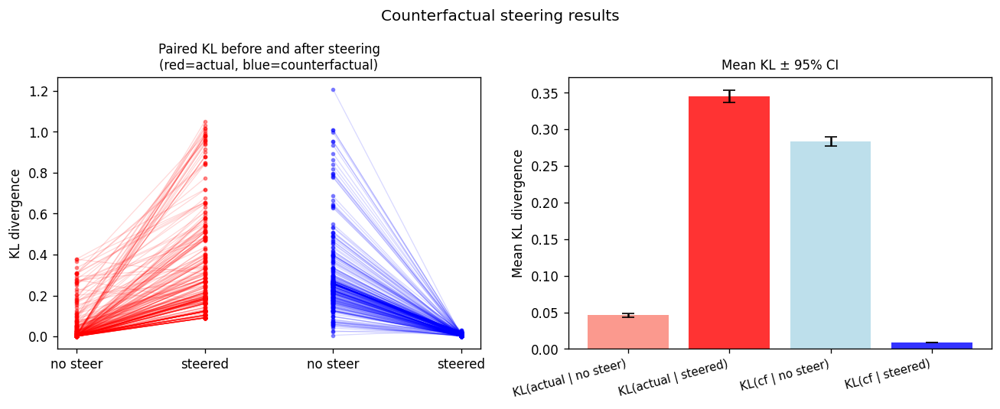

KL(actual  | no steer): 0.0460 ± 0.0026
KL(actual  | steered):  0.3455 ± 0.0084  (expect: ↑)
KL(cf      | no steer): 0.2836 ± 0.0059
KL(cf      | steered):  0.0087 ± 0.0002  (expect: ↓)


In [85]:
kl_an = np.array(kl_actual_no_list)
kl_as_ = np.array(kl_actual_steer_list)
kl_cn = np.array(kl_cf_no_list)
kl_cs = np.array(kl_cf_steer_list)

# Summary: mean and 95% CI
def mean_ci(arr: np.ndarray) -> tuple[float, float]:
    n = len(arr)
    m = arr.mean()
    se = arr.std() / math.sqrt(n)
    return m, 1.96 * se

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))

# Left: scatter plot with paired lines
ax = axes[0]
subsample = min(len(kl_an), 300)
rng = np.random.default_rng(0)
idx_sub = rng.choice(len(kl_an), size=subsample, replace=False)
for i in idx_sub:
    ax.plot([0, 1], [kl_an[i], kl_as_[i]], "r-", alpha=0.15, lw=0.8)
    ax.plot([2, 3], [kl_cn[i], kl_cs[i]], "b-", alpha=0.15, lw=0.8)
for xs, ys, col in [(0, kl_an, "r"), (1, kl_as_, "r"), (2, kl_cn, "b"), (3, kl_cs, "b")]:
    ax.scatter([xs]*len(ys[idx_sub]), ys[idx_sub], c=col, s=6, alpha=0.4, zorder=3)
ax.set_xticks([0, 1, 2, 3])
ax.set_xticklabels(["no steer", "steered", "no steer", "steered"])
ax.set_ylabel("KL divergence")
ax.set_title("Paired KL before and after steering\n(red=actual, blue=counterfactual)", fontsize=10)

# Right: mean + 95% CI bar chart
ax2 = axes[1]
labels = ["KL(actual | no steer)", "KL(actual | steered)",
          "KL(cf | no steer)", "KL(cf | steered)"]
means, cis = zip(*[mean_ci(a) for a in [kl_an, kl_as_, kl_cn, kl_cs]])
colors_bar = ["salmon", "red", "lightblue", "blue"]
bars = ax2.bar(range(4), means, yerr=cis, color=colors_bar, alpha=0.8,
               capsize=5, error_kw={"lw": 1.5})
ax2.set_xticks(range(4))
ax2.set_xticklabels(labels, rotation=15, ha="right", fontsize=9)
ax2.set_ylabel("Mean KL divergence")
ax2.set_title("Mean KL ± 95% CI", fontsize=10)

plt.suptitle("Counterfactual steering results", fontsize=12)
plt.tight_layout()
plt.show()

print(f"KL(actual  | no steer): {means[0]:.4f} ± {cis[0]:.4f}")
print(f"KL(actual  | steered):  {means[1]:.4f} ± {cis[1]:.4f}  (expect: ↑)")
print(f"KL(cf      | no steer): {means[2]:.4f} ± {cis[2]:.4f}")
print(f"KL(cf      | steered):  {means[3]:.4f} ± {cis[3]:.4f}  (expect: ↓)")

The crossover is the causal signature. After injecting the counterfactual belief:
- KL to the optimal-actual prediction *increases* — the model predicts less like what the real sequence demands
- KL to the optimal-counterfactual prediction *decreases* — the model predicts more like what the counterfactual demands

For reference, here's the same plot from the full research run (10,000 sequences):

### Additive Sweep

Rather than a binary replace, we can blend the original activation with the target activation using a mixing parameter $\lambda \in [0, 1]$:

$$\text{act}_{\text{steered}} = \text{act}_{\text{original}} + \lambda \cdot (\text{act}_{\text{target}} - \text{act}_{\text{current}})$$

At $\lambda = 0$ there's no intervention; at $\lambda = 1$ it's a full replacement. 

As $\lambda$ increases, KL to the counterfactual optimal decreases monotonically while KL to the actual optimal increases. This rules out the alternative hypothesis that *any* perturbation to the residual stream produces this effect — the change is directional and proportional to how much belief content we inject.

Let's run the same sweep ourselves. For each λ we apply the additive hook — `acts[:, pos, :] += λ * (decoded_cf - decoded_actual)` — and measure the resulting KL to both the actual and counterfactual optima:

Additive sweep:   0%|          | 0/11 [00:00<?, ?it/s]

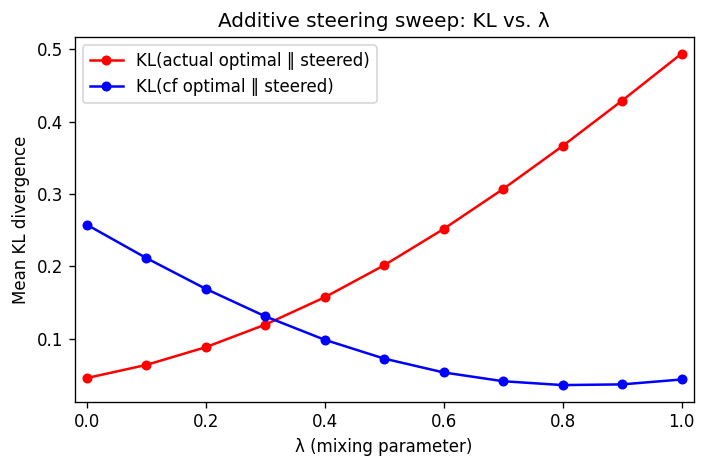

In [86]:
torch.manual_seed(0)
N_ADD = 500
LAMBDAS = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]

toks_add, _ = hmm.generate_batch(batch_size=N_ADD, seq_len=model.cfg.n_ctx)
toks_add = toks_add.to(device)
beliefs_add = hmm.belief_states(toks_add)

mean_kl_actual_by_lam: list[float] = []
mean_kl_cf_by_lam: list[float] = []

for lam in tqdm(LAMBDAS, desc="Additive sweep"):
    kl_actual_lam: list[float] = []
    kl_cf_lam: list[float] = []

    for idx in range(N_ADD):
        eta_prev_a = beliefs_add[idx, STEER_POS_AGG - 1, :].to(torch.float32).to(device)
        eta_curr_a = beliefs_add[idx, STEER_POS_AGG, :].to(torch.float32).to(device)
        cur_tok_a = int(toks_add[idx, STEER_POS_AGG].item())

        emission_p = hmm.optimal_next_token_probs_from_beliefs(eta_prev_a.unsqueeze(0)).squeeze(0)
        legal_a = [t for t in range(3) if emission_p[t].item() > 0.0 and t != cur_tok_a]
        if not legal_a:
            continue
        cf_tok_a = legal_a[0]

        numer_a = torch.matmul(eta_prev_a, emit_agg[cf_tok_a])
        eta_tilde_a = numer_a / numer_a.sum()

        optimal_actual_a = hmm.optimal_next_token_probs_from_beliefs(eta_curr_a.unsqueeze(0)).squeeze(0)
        optimal_cf_a = hmm.optimal_next_token_probs_from_beliefs(eta_tilde_a.unsqueeze(0)).squeeze(0)

        proj_tilde = autoencoder.decode_from_belief(eta_tilde_a.float().unsqueeze(0).to(device))
        proj_curr = autoencoder.decode_from_belief(eta_curr_a.float().unsqueeze(0).to(device))
        delta = proj_tilde - proj_curr
        lam_tensor = torch.tensor(lam, device=device)

        def _hook_add(acts: Tensor, hook=None, _d=delta, _l=lam_tensor) -> Tensor:
            u = acts.clone()
            u[:, STEER_POS_AGG, :] = acts[:, STEER_POS_AGG, :] + _l * _d
            return u

        with torch.no_grad():
            logits_a = model.run_with_hooks(
                toks_add[idx].unsqueeze(0), return_type="logits",
                fwd_hooks=[("blocks.3.hook_resid_post", _hook_add)]
            )
        probs_a = torch.softmax(logits_a[0, STEER_POS_AGG, :], dim=-1).to(torch.float32)
        log_pa = torch.log(probs_a.clamp_min(1e-12))

        kl_actual_lam.append(kl_divergence(optimal_actual_a, log_pa).item())
        kl_cf_lam.append(kl_divergence(optimal_cf_a, log_pa).item())

    mean_kl_actual_by_lam.append(np.mean(kl_actual_lam) if kl_actual_lam else float("nan"))
    mean_kl_cf_by_lam.append(np.mean(kl_cf_lam) if kl_cf_lam else float("nan"))

fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(LAMBDAS, mean_kl_actual_by_lam, "r-o", ms=5, label="KL(actual optimal ‖ steered)")
ax.plot(LAMBDAS, mean_kl_cf_by_lam, "b-o", ms=5, label="KL(cf optimal ‖ steered)")
ax.set_xlabel("λ (mixing parameter)")
ax.set_ylabel("Mean KL divergence")
ax.set_title("Additive steering sweep: KL vs. λ")
ax.legend()
ax.set_xlim(-0.02, 1.02)
plt.tight_layout()
plt.show()

---

## 5. Discussion

### What we showed

Working through this from first principles, here's what the evidence adds up to:

1. **The belief geometry is linearly encoded.** A single linear layer, trained on residual stream activations, recovers the fractal simplex geometry of the ground-truth belief states with high fidelity. The model didn't have to do this — it could have encoded belief information in a curved or otherwise non-linear subspace — but it chose the simplest possible representation.

2. **The encoding is causally upstream of prediction.** When we surgically replace the encoded belief with a counterfactual one, next-token predictions shift in exactly the direction we'd expect if those predictions were being computed from the belief state. This isn't just correlation.

3. **The effect is graded and directional.** The additive sweep shows that partially steering the belief (small $\lambda$) produces proportional changes in prediction. This rules out "any perturbation does this" — the effect is specific to the direction of belief manipulation.

### What remains open

We've shown that the belief geometry is stored in the residual stream and used for prediction. But we haven't shown that the model has learned the *dynamics* of the HMM — the Bayesian update step. Does the model actually compute the update $\eta_t^j \propto \sum_i \eta_{t-1}^i \cdot T^{(x_t)}_{ij}$ in forward pass, or does it arrive at the right belief state through some other mechanism? Answering this would require probing how the belief updates flow across attention layers.

The other obvious question: does this hold in larger models on natural language? Mess3 is an idealized setting — 3 states, 3 tokens, infinite context. Shai et al.'s Simplex team is pursuing the production-scale version. If similar belief geometries appear in large language models trained on real data, it would strongly suggest that the drive toward accurate next-token prediction generically pushes models toward building world models.

**Zero-ablation baseline.** One sanity check worth noting: replacing the residual stream with zeros (rather than a decoded counterfactual belief) degrades predictions uniformly — all KL values increase by roughly the same amount. This is the expected behavior of destroying information, not steering it. The counterfactual steering results are qualitatively different: one KL goes up, the other goes down. That structured, directional effect is what the causal claim rests on.